# Kartlegging
https://github.com/statisticsnorway/ssb-sgis

Åpne heller notebooken her: https://nbviewer.org/github/statisticsnorway/intro_til_geopandas/blob/main/kartlegging.ipynb

In [1]:
import geopandas as gpd
import pandas as pd
import numpy as np
import sgis as sg

## Statiske kart

Henter forenklede kommunerdata.

In [2]:
n5000_kommunesti = "ssb-prod-kart-data-delt/kartdata_visualisering/klargjorte-data/2022/parquet/N5000_kommune_flate_p2022_v1.parquet"

kommuner = sg.read_geopandas(n5000_kommunesti)

kommuner["km2"] = kommuner.area / 1_000_000

kommuner.head(3)

,OBJTYPE,NAVN,KOMMUNENR,SHAPE_Length,SHAPE_Area,geometry,km2
0,Kommune,Alstahaug,1820,126623.728536,1.542645e+08,"MULTIPOLYGON (((393031.130 7322897.000, 392431...",154.264453
1,Kommune,Alta,5403,605644.767959,3.742475e+09,"MULTIPOLYGON (((827951.920 7819380.820, 830139...",3742.475010
2,Kommune,Alvdal,3428,144895.626627,9.325153e+08,"MULTIPOLYGON (((284645.390 6883576.450, 285460...",932.515296


Kart over kvadratkilometer med den innebygde geopandas plot-funksjonen:

<Axes: >

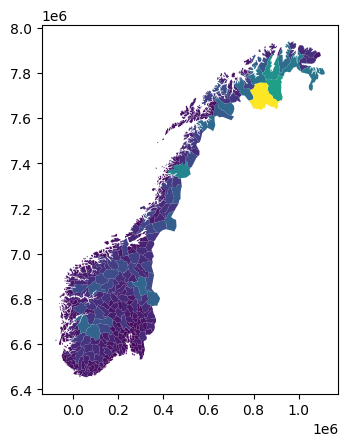

In [16]:
kommuner.plot("km2")

En mer fleksibel løsning:

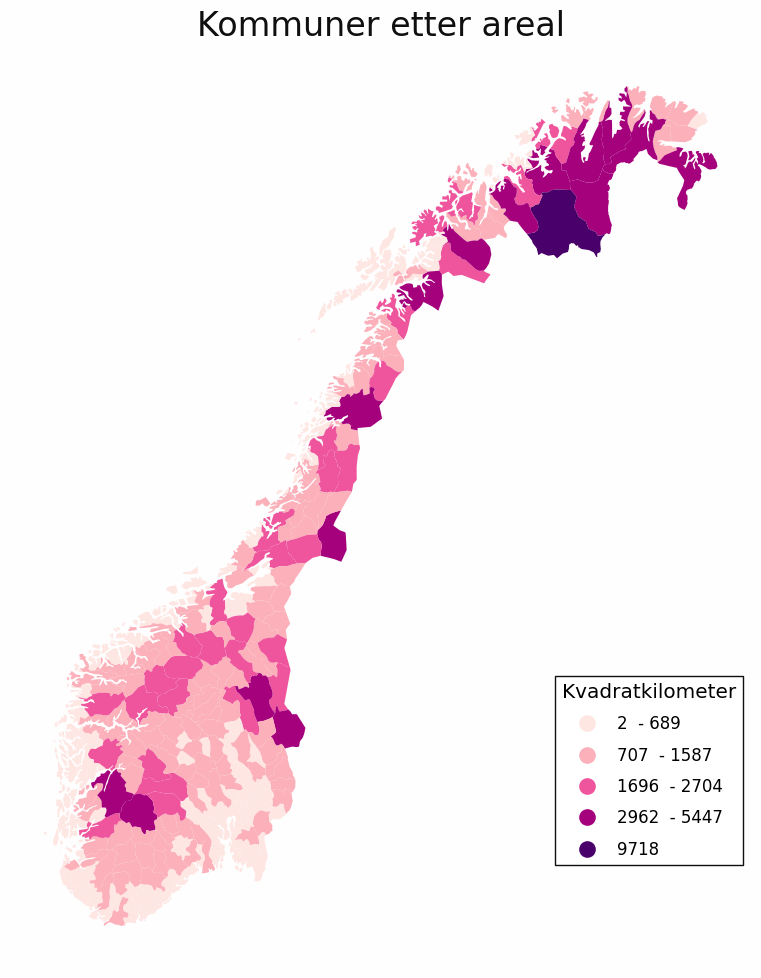

In [4]:
m = sg.ThematicMap(kommuner, column="km2", size=12)
m.title = "Kommuner etter areal"
m.legend.title = "Kvadratkilometer"
m.legend.position = (0.8, 0.35)
m.plot()

Andre farger og egendefinerte grenseverdier.

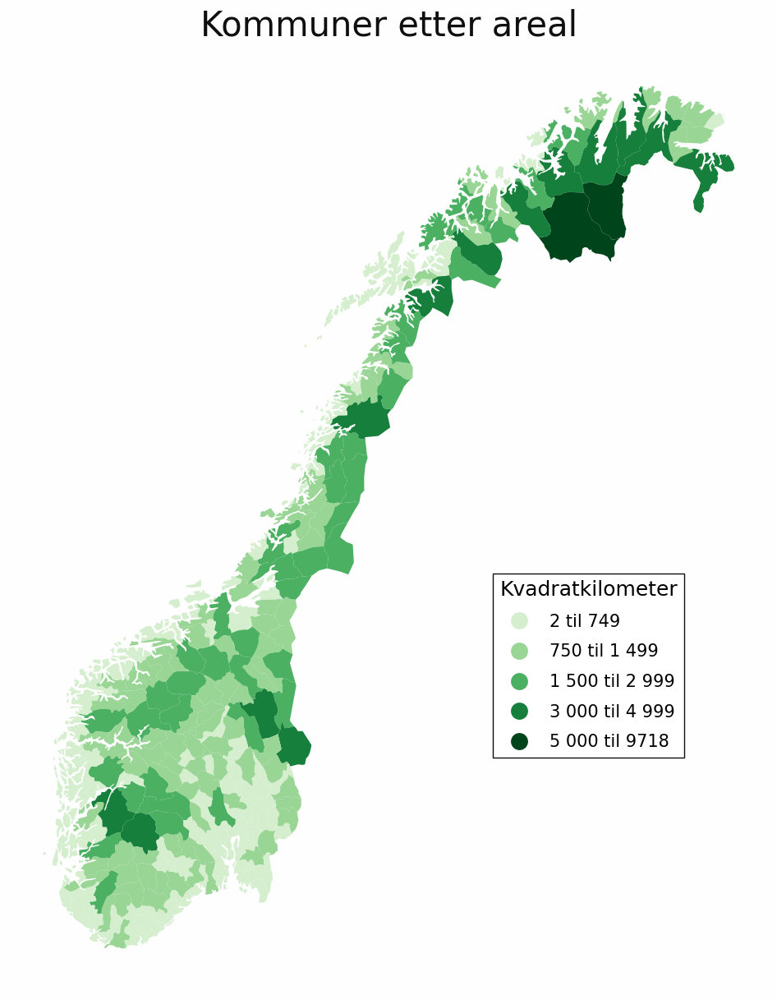

In [24]:
m = sg.ThematicMap(kommuner, column="km2", size=15)
m.title = "Kommuner etter areal"
m.legend.title = "Kvadratkilometer"
m.legend.position = (0.8, 0.35)
m.cmap = "Greens"
m.cmap_start = 50

m.bins = [749, 1499, 2999, 4999]

min_ = int(round(min(kommuner.km2), 0))
max_ = int(round(max(kommuner.km2), 0))

m.legend.labels = [
    f"{min_} til 749",
    "750 til 1 499",
    "1 500 til 2 999",
    "3 000 til 4 999",
    f"5 000 til {max_}",
]

m.plot()

## Interaktive kart

Henter bygningsdata.

In [6]:
aar = 2022

bygningspunktsti = f"ssb-prod-kart-data-delt/kartdata_analyse/klargjorte-data/{aar}/SMAT_bygg_punkt_p{aar}_v1.parquet"

bygg = sg.read_geopandas(
    bygningspunktsti,
    filters=[("KOMMUNENR", "in", ('0301','3401'))],
    columns=["KOMMUNENR", "BYGTYPE", "AREAL_E2", "DATOMERGE", "geometry"]
)

bygg["aar"] = bygg.DATOMERGE.map(lambda x: int(x[:4].replace(" ", "0")))

bygg

,KOMMUNENR,BYGTYPE,AREAL_E2,DATOMERGE,geometry,aar
2295777,0301,111,112.0,19871001,POINT (266589.000 6638437.000),1987
2295778,0301,133,60.0,19990827,POINT (266732.000 6638437.000),1999
2295785,0301,181,33.0,,POINT (268985.000 6638438.000),0
2295807,0301,111,95.0,19010101,POINT (268630.000 6638490.000),1901
2295816,0301,181,27.0,19971015,POINT (266745.000 6638491.000),1997
...,...,...,...,...,...,...
2829598,3401,249,49.0,,POINT (334172.000 6694149.000),0
2829599,3401,249,49.0,,POINT (334187.000 6694149.000),0
2829613,3401,181,33.0,,POINT (337419.000 6694152.000),0
2829620,3401,181,39.0,19971125,POINT (333568.000 6694153.000),1997


Lager noen eksempelsirkler.

In [7]:
noen_bygg1 = bygg.loc[bygg.KOMMUNENR == "0301"].sample(50).pipe(sg.buff, 150)
noen_bygg2 = bygg.loc[bygg.KOMMUNENR == "0301"].sample(50).pipe(sg.buff, 300)
noen_bygg3 = bygg.loc[bygg.KOMMUNENR == "0301"].sample(50).pipe(sg.buff, 450)

Kartlegg tre GeoDataFrames med geopandas.explore:

In [8]:
pd.concat(
    [
        noen_bygg1.assign(hva="noen_bygg1"),
        noen_bygg2.assign(hva="noen_bygg2"),
        noen_bygg3.assign(hva="noen_bygg3"),
    ]
).explore("hva")

Alternativ: sgis.explore. Med ulike bakgrunnskart og mulighet til å skru av og på lagene.

In [9]:
sg.explore(noen_bygg3, noen_bygg2, noen_bygg1)

Med kolonne:

In [10]:
sg.explore(noen_bygg3, noen_bygg2, noen_bygg1, column="area")

Med ikke-numerisk kolonne og bare én GeoDataFrame, kan man huke av/på hver kategori.

In [11]:
noen_bygg = bygg.loc[bygg.aar > 1000].sample(5_000)

til_aarhundre = lambda aar: str(aar)[:2] + "00"
noen_bygg["aarhundre"] = noen_bygg.aar.map(til_aarhundre).astype("category")

sg.explore(noen_bygg, column="aarhundre")

Hvis dataene, som her, er for tunge til å vises samtidig, kan man bruke samplemap og clipmap.

De har samme funksjonalitet som exolore, men viser kun et tilfeldig/angitt område.

Legger til vegdata.

In [12]:
kartdata = "ssb-prod-kart-data-delt/kartdata_analyse/klargjorte-data"

veger = sg.read_geopandas(
    f"{kartdata}/2022/NVDB_ruteplan_nettverk_p20220703_v1.parquet",
    filters=[("KOMMUNENR", "=", '0301')]
     )

veger = veger[["oneway", "drivetime_fw", "drivetime_bw", "roadid", "KOMMUNENR", "geometry"]]

veger

,oneway,drivetime_fw,drivetime_bw,roadid,KOMMUNENR,geometry
119702,B,0.216611,0.216611,{S944},0301,MULTILINESTRING Z ((258028.440 6674249.890 413...
199710,FT,0.099323,-1.000000,{R163},0301,MULTILINESTRING Z ((271778.700 6653238.900 138...
199725,FT,0.173963,-1.000000,{R163},0301,MULTILINESTRING Z ((271884.510 6653207.540 142...
199726,FT,0.011827,-1.000000,{R163},0301,MULTILINESTRING Z ((271884.510 6653207.540 142...
199733,FT,0.009097,-1.000000,{R163},0301,MULTILINESTRING Z ((271877.373 6653214.697 141...
...,...,...,...,...,...,...
1944061,FT,0.010482,-1.000000,{R191},0301,MULTILINESTRING Z ((268649.503 6651869.320 111...
1944324,B,0.135561,0.135561,{P10977},0301,MULTILINESTRING Z ((259501.570 6648459.580 3.2...
1944330,B,0.068239,0.068239,{P11967},0301,MULTILINESTRING Z ((258292.600 6648313.440 18....
1944341,B,0.023629,0.023629,{P11967},0301,MULTILINESTRING Z ((258291.452 6648289.258 19....


Og kartlegger et tilfeldig område.

In [15]:
sg.samplemap(veger, bygg)

Kartlegg utvalgt område.

In [14]:
bygdoy = sg.to_gdf([10.6812329, 59.9069741], crs=4326).to_crs(25833)
sg.clipmap(veger, bygg, mask=bygdoy.buffer(1250))